# **Projeto Final introdução a redes neurais - Detecção de Objetos em Câmeras Veiculares Utilizando YOLO** 

------------------------------------------------------------------------------------------------------------

## Objetivo: 

O objetivo deste projeto é desenvolver um sistema de detecção de objetos utilizando redes neurais convolucionais (CNNs), com foco no modelo **YOLO (*You Only Look Once*)**, aplicado a câmeras veiculares. A ideia principal é identificar e localizar automaticamente elementos presentes em cenários de tráfego, como pedestres, veículos, sinais de trânsito e outros objetos relevantes, a partir de vídeos capturados por câmeras embarcadas em veículos.

## Dataset

O **BDD100K (*Berkeley DeepDrive 100K*)** é um dos maiores e mais diversificados datasets públicos para visão computacional aplicada a cenários de tráfego. Ele consiste em 100.000 vídeos e imagens anotados, capturados em diferentes condições climáticas, horários do dia e locais, representando uma ampla variedade de cenários urbanos e rodoviários. O dataset inclui anotações para tarefas como detecção de objetos, segmentação semântica, rastreamento de múltiplos objetos e classificação de cenários.

Os vídeos têm resolução de 720x1280 e duração média de 40 segundos, enquanto as anotações abrangem classes como pedestres, veículos, sinais de trânsito, ciclistas, entre outros. 

## Bibliotecas

In [1]:
import os
import cv2
import time
from ultralytics import YOLO
from IPython.display import Video, display
from glob import glob
import matplotlib.pyplot as plt
import random

## Preparação dos dados

Neste projeto, os dados utilizados consistem em frames extraídos do dataset BDD100K, que contém cenas capturadas por câmeras veiculares em ambientes urbanos com variadas condições de tráfego. A seguir, mostramos três exemplos de imagens do dataset para verificar a qualidade dos dados.

O código realiza as seguintes operações:
- Busca os vídeos com extensão `.mp4` a partir de um diretório específico.
- Seleciona aleatoriamente três vídeos.
- Extrai o primeiro frame de cada vídeo.
- Converte os frames de BGR para RGB para a visualização correta.
- Plota os frames lado a lado utilizando o `matplotlib`.

A seguir, são descritas as funções e métodos utilizados:

---

### `glob.glob`
A função **`glob.glob`** é utilizada para buscar todos os arquivos que correspondem a um padrão especificado.  

---

### `os.path.join`
A função **`os.path.join`** concatena partes de um caminho de forma segura, garantindo que os separadores de diretório sejam os corretos para o sistema operacional.  

---

### `random.sample`
A função **`random.sample`** seleciona aleatoriamente um número específico de elementos de uma sequência, sem repetição.  

---

### `os.path.basename`
A função **`os.path.basename`** extrai o nome do arquivo a partir de um caminho completo, removendo os diretórios anteriores.  

---

### `cv2.VideoCapture`
A classe **`cv2.VideoCapture`** do OpenCV permite abrir e capturar frames de um vídeo.  

---

### `cap.read()`
O método **`read()`** do objeto `VideoCapture` retorna um booleano indicando se a leitura foi bem-sucedida e o frame capturado.  

---

### `cv2.cvtColor`
A função **`cv2.cvtColor`** converte a representação de cores de uma imagem.  

Vídeos selecionados: ['627.mp4', '1589.mp4', '1123.mp4']


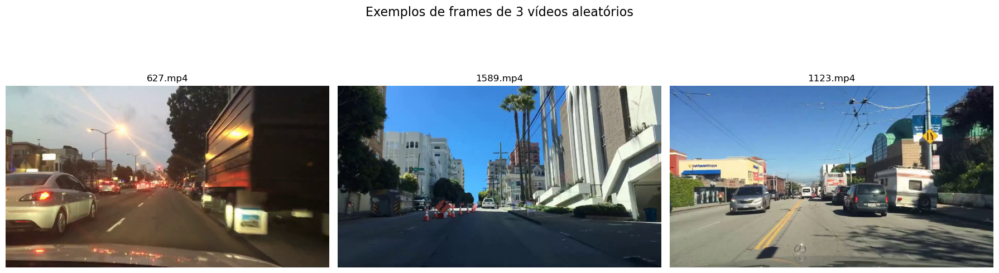

In [2]:
# Diretório contendo os vídeos
caminho_videos = "BDDA/test/camera_videos"
videos = sorted(glob(os.path.join(caminho_videos, "*.mp4")))

# Selecionar 3 vídeos aleatórios
videos_aleatorios = random.sample(videos, 3)
print("Vídeos selecionados:", [os.path.basename(i) for i in videos_aleatorios])

# Extrair o primeiro frame de cada vídeo
frames = []
nomes_videos = []

for video in videos_aleatorios:
    captura = cv2.VideoCapture(video)
    ret, frame = captura.read()
    if ret:
        # Converter o frame de BGR para RGB 
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frames.append(frame_rgb)
        nomes_videos.append(os.path.basename(video))
    else:
        print(f"Não foi possível ler o vídeo: {video}")
    captura.release()

# Plotar os 3 frames lado a lado
plot, i = plt.subplots(1, 3, figsize=(18, 6))
for j, frame in enumerate(i):
    frame.imshow(frames[j])
    frame.set_title(nomes_videos[j])
    frame.axis("off")
plt.suptitle("Exemplos de frames de 3 vídeos aleatórios", fontsize=16)
plt.tight_layout()
plt.show()

## Redes CNN

### Definição

As redes convolucionais (CNN) são uma classe de redes neurais especialmente eficazes para o processamento de dados estruturados, como imagens, séries temporais e outros. Elas utilizam operações de convolução para extrair características locais dos dados, reduzindo o número de parâmetros e melhorando a generalização.

### Campos Receptivos Locais

- O cérebro não analisa a imagem de forma global; ao invés disso, células específicas se concentram em regiões específicas, formando os chamados *campos receptivos locais*.
- Essa abordagem é a base das **Redes Convolucionais (CNN)**.

### Comparação com Redes MLP

- Ao contrário das redes MLP, as CNNs utilizam campos receptivos locais, e não globais.
- Há replicação dos neurônios em um mesmo filtro.
- Isso resulta em uma significativa redução do número de parâmetros livres.

### Convolução

A operação de convolução pode ser definida como:

$$
f_{og}(x) = \sum_{k=-M}^{M} f(x-k) \, g(k)
$$

- Em redes convolucionais, a convolução pode ser aplicada a múltiplos canais.

### Camada de Pooling

- A camada de *Pooling* reduz o mapa de características gerado pela camada convolucional.
- Diminui o custo computacional do modelo.
- Introduz invariância à translação, melhorando a robustez do modelo.

### Stride e Padding

- **Stride**: deslocamento da janela durante a aplicação da convolução (por exemplo, *stride* = 1).
- **Padding**: preenchimento das bordas da imagem para controlar o tamanho do mapa de características resultante.
  - Pode ser definido como 0 (sem preenchimento), por replicação, com um valor constante ou de forma circular.



## YOLO

YOLO (You Only Look Once) é um algoritmo de detecção de objetos que identifica e localiza múltiplos objetos em uma única passagem pela rede, tornando-o extremamente rápido e ideal para aplicações em tempo real, como em câmeras veiculares.

#### Arquitetura do YOLOv8 (Ultralytics)

A versão do YOLOv8 utilizada neste projeto segue uma arquitetura modular composta por três blocos principais:

- **Backbone:**  
  O backbone é responsável por extrair características relevantes da imagem por meio de uma longa sequência de operações convolucionais. No YOLOv8, é utilizado o **CSPDarknet53**, que introduz conexões parciais entre estágios (*Cross-Stage Partial Connections*) para melhorar o fluxo de informações e otimizar o treinamento. Além disso, o backbone utiliza funções de ativação como a SiLU para melhorar a extração de padrões. A função de ativação SiLU é definida por  
  $$
  SiLU(x) = x \cdot \sigma(x) = \frac{x}{1 + e^{-x}}
  $$

- **Neck:**  
  A etapa do neck integra as múltiplas escalas de features extraídas pelo backbone. O YOLOv8 utiliza o módulo **C2f**, uma evolução dos blocos CSP, para combinar informações semânticas de alto nível com detalhes espaciais de baixo nível. Além disso, o modelo incorpora a camada **SPPF** (Spatial Pyramid Pooling Fast), que captura características em múltiplas escalas para melhorar a detecção de objetos em diferentes tamanhos. Por exemplo, no max pooling, a operação pode ser descrita como:  
  $$
  y[i,j] = \max_{m,n \in \text{janela}}\; x[i \cdot s + m,\, j \cdot s + n]
  $$  
  onde $s$ representa o stride da janela.

- **Head:**  
  A head é composta por camadas finais convolucionais que convertem as features integradas em predições. O YOLOv8 utiliza um head sem âncoras (anchor-free), eliminando a necessidade de caixas delimitadoras pré-definidas. Essa abordagem melhora a eficiência e reduz a complexidade do modelo. Em cada célula da grade, a head realiza:  
  - Regressão das coordenadas das bounding boxes,  
  - Estimativa dos scores de confiança, e  
  - Classificação dos objetos.

#### Inovações no YOLOv8

O YOLOv8 introduz diversas inovações que aprimoram sua precisão e eficiência:

- **Atenção Espacial:** Mecanismos que enfocam as partes mais relevantes da imagem para melhorar a localização dos objetos.
- **Fusão de Features:** O módulo C2f combina informações semânticas e espaciais em diferentes escalas.
- **SPPF:** A camada SPPF captura características em múltiplas escalas com menor custo computacional.
- **Treinamento com Dados Aumentados:** Técnicas como mosaic augmentation são utilizadas para melhorar a capacidade de generalização do modelo.

#### Pré-Treinamento

O modelo vem pré-treinado no dataset **COCO (Common Objects in Context)**, que contém mais de 200.000 imagens anotadas em 80 classes de objetos. Durante o treinamento, o YOLOv8 aprendeu a identificar e localizar uma ampla variedade de objetos em cenários diversos, garantindo sua robustez e capacidade de generalização para novas aplicações, como a detecção em imagens capturadas por câmeras veiculares.

#### Visualização da arquitetura e importação do modelo

In [3]:
# Carregar o modelo YOLOv8 a partir da pasta "yolo"
caminho_modelo = "yolo/yolov8n.pt"
modelo = YOLO(caminho_modelo)
modelo.info()

YOLOv8n summary: 225 layers, 3,157,200 parameters, 0 gradients, 8.9 GFLOPs


(225, 3157200, 0, 8.8575488)

A saída fornecida pelo comando `model.info()` indica os seguintes pontos importantes sobre a arquitetura do modelo:

- **225 camadas:**  
  O YOLOv8n é composto por um total de 225 camadas. Esse número inclui todas as camadas convolucionais, de pooling, de ativação e quaisquer outras operações que formam o fluxo de dados do modelo. Em termos práticos, ele reflete a profundidade e a complexidade da rede.

- **3.157.200 parâmetros:**  
  Este valor representa o total de parâmetros aprendíveis do modelo, ou seja, as variáveis (pesos e vieses) que o modelo ajusta durante o treinamento. Com aproximadamente 3,16 milhões de parâmetros, o YOLOv8n é uma das variantes mais leves, o que o torna adequado para aplicações em tempo real e dispositivos com recursos computacionais limitados.

- **0 gradientes:**  
  O fato de o resumo indicar 0 gradientes significa que, no momento em que a informação foi exibida, o modelo não estava computando gradientes. Isso é comum quando o modelo está em modo de inferência (avaliação) ou quando os gradientes foram desativados para economizar memória durante o teste.

- **8.9 GFLOPs:**  
  GFLOPs (Giga Floating Point Operations per Second) mede a complexidade computacional do modelo. O valor de 8,9 GFLOPs indica que, para cada imagem de entrada, o modelo realiza aproximadamente 8,9 bilhões de operações de ponto flutuante, o que é relativamente baixo e contribui para sua rapidez e eficiência, especialmente em aplicações onde o tempo de resposta é crítico.

Em resumo, esse resumo mostra que o YOLOv8n é um modelo compacto e eficiente, com uma arquitetura profundamente composta (225 camadas) que utiliza cerca de 3,16 milhões de parâmetros e requer 8,9 GFLOPs para processar uma imagem, sendo otimizado para aplicações em tempo real, onde os gradientes não são necessários durante a inferência.

## Implementação

### Imagens

Neste código, realizamos a inferência do modelo YOLOv8 em três imagens aleatórias de teste extraídas de vídeos de câmeras veiculares, com o objetivo de demonstrar a capacidade de detecção de objetos em diferentes cenários. A abordagem consiste nas seguintes etapas:

1. **Seleção Aleatória de Vídeos:**  
   São listados todos os vídeos presentes na pasta `BDDA/test/camera_videos` e, em seguida, três vídeos são selecionados aleatoriamente. Essa seleção garante que a demonstração seja representativa e variada.

2. **Extração dos Frames:**  
   Para cada vídeo selecionado, utilizamos o OpenCV para abrir o arquivo e extrair o primeiro frame. Estes frames servem como imagens de teste para aplicar o modelo.

3. **Aplicação do Modelo YOLOv8:**  
   Cada frame é redimensionado para a resolução padrão de 1280x720 (para consistência de processamento). Posteriormente, o modelo é aplicado a cada imagem, realizando a detecção de objetos. O método `previsao_yolo[0].plot()` é usado para gerar o frame anotado com as caixas delimitadoras e os rótulos dos objetos detectados.

4. **Visualização dos Resultados:**  
   Por fim, cada frame anotado é convertido de BGR para RGB (para visualização correta com Matplotlib) e exibido lado a lado, acompanhado do nome do vídeo de origem. Essa etapa facilita a inspeção visual dos resultados, demonstrando a eficácia do YOLOv8 na tarefa de detecção de objetos em imagens extraídas de vídeos.


Vídeos selecionados: ['1648.mp4', '238.mp4', '795.mp4']

0: 384x640 3 persons, 10 cars, 43.9ms
Speed: 5.1ms preprocess, 43.9ms inference, 139.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 car, 9.6ms
Speed: 2.2ms preprocess, 9.6ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 cars, 9.7ms
Speed: 2.3ms preprocess, 9.7ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


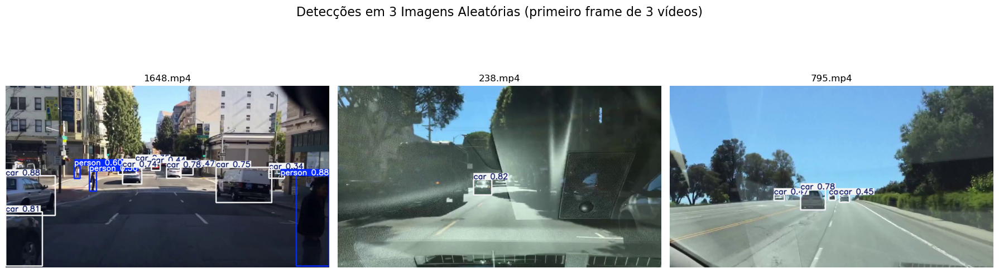

In [4]:
# Diretório contendo os vídeos de teste (câmeras veiculares)
caminho_videos = "BDDA/test/camera_videos"
arquivos_videos = sorted(glob(os.path.join(caminho_videos, "*.mp4")))

# Selecionar aleatoriamente 3 vídeos
videos_aleatorios = random.sample(arquivos_videos, 3)
print("Vídeos selecionados:", [os.path.basename(i) for i in videos_aleatorios])

# Extrair o primeiro frame de cada vídeo (que serão utilizados como imagens de teste)
frames = []
nomes_videos = []
for video in videos_aleatorios:
    captura = cv2.VideoCapture(video)
    ret, frame = captura.read()  # Extraindo o primeiro frame
    if ret:
        frames.append(frame)
        nomes_videos.append(os.path.basename(video))
    else:
        print(f"Não foi possível ler o vídeo: {video}")
    captura.release()

# Aplicar o modelo em cada uma das 3 imagens e exibir os resultados
plot, img = plt.subplots(1, 3, figsize=(18, 6))
for i, j in enumerate(img):
    # Opcional: redimensionar o frame para a resolução desejada (por exemplo, 1280x720)
    frame_redimensionado = cv2.resize(frames[i], (1280, 720))
    
    # Executar o modelo YOLO para realizar a detecção de objetos na imagem
    previsao_yolo = modelo(frame_redimensionado)
    
    # Obter o frame anotado (com as detecções desenhadas)
    frame_yolo = previsao_yolo[0].plot()
    
    # Converter de BGR para RGB para a exibição correta com Matplotlib
    rgb = cv2.cvtColor(frame_yolo, cv2.COLOR_BGR2RGB)
    
    # Exibir cada imagem com seu título (nome do vídeo de origem)
    j.imshow(rgb)
    j.set_title(nomes_videos[i])
    j.axis("off")

plt.suptitle("Detecções em 3 Imagens Aleatórias (primeiro frame de 3 vídeos)", fontsize=16)
plt.tight_layout()
plt.show()


### Vídeos

Nesta etapa do projeto, o objetivo foi aplicar o modelo YOLOv8 pré-treinado em três vídeos selecionados aleatoriamente a partir do dataset de câmeras veiculares. Essa abordagem demonstra como o modelo realiza a inferência em cada frame, anotando as detecções (bounding boxes, rótulos e scores) e produzindo vídeos processados que evidenciam a eficácia do sistema para aplicações em tempo real.

#### Etapas do Processo

1. **Seleção Aleatória dos Vídeos:**  
   São listados os arquivos de vídeo contidos na pasta `BDDA/test/camera_videos` e três vídeos são escolhidos de forma aleatória. Essa seleção garante que diferentes cenários sejam avaliados.

2. **Processamento dos Vídeos:**  
   Para cada vídeo selecionado:
   - O vídeo é aberto com o OpenCV usando `cv2.VideoCapture`.
   - Cada frame do vídeo é redimensionado para uma resolução fixa de **1280x720**, garantindo a consistência dos dados.
   - O modelo YOLOv8 é aplicado a cada frame para realizar a detecção dos objetos. O método `plot()` do resultado gera um frame anotado, ou seja, o que o modelo previu para a imagem, com as caixas delimitadoras e os rótulos desenhados.
   - Os frames anotados são gravados em um novo vídeo utilizando um `cv2.VideoWriter` configurado para **30 FPS**.

3. **Conversão dos Vídeos:**  
   Após o processamento, cada vídeo resultante é convertido para um formato compatível com o player do IPython. Para isso, a ferramenta **FFmpeg** é utilizada para converter o vídeo utilizando o codec **H264 (libx264)**, definindo o formato dos pixels como **yuv420p** e aplicando a flag **+faststart** para otimizar a reprodução.

4. **Exibição dos Vídeos Processados:**  
   Por fim, os vídeos convertidos são exibidos diretamente no notebook, permitindo visualizar os resultados da inferência e a performance do modelo em cenários reais extraídos das câmeras veiculares.

In [5]:
# Selecionar 3 vídeos aleatórios
videos_aleatorios = random.sample(arquivos_videos, 3)
print("Vídeos selecionados:", [os.path.basename(i) for i in videos_aleatorios])
pasta_saida = "./videos"

# Processar cada vídeo separadamente
for video in videos_aleatorios:
    captura = cv2.VideoCapture(video)
    if not captura.isOpened():
        print(f"Não foi possível abrir o vídeo: {video}")
        continue

    # Definir a resolução fixa e FPS (720x1280 e 30 FPS)
    resolucao = (1280, 720)
    fps_saida = 30

    
    # Configurar o VideoWriter para salvar o vídeo processado
    nome = os.path.basename(video)
    caminho_saida = os.path.join(pasta_saida, f"video_aleatorio_{nome}")
    codec = cv2.VideoWriter_fourcc(*'mp4v')
    writer = cv2.VideoWriter(caminho_saida, codec, fps_saida, resolucao)
    
    print(f"Processando o vídeo: {video}")
    while True:
        ret, frame = captura.read()
        if not ret:
            print("Fim do vídeo de entrada.")
            break
        
        # Redimensionar o frame para a resolução fixa (720x1280)
        frame_redimensionado = cv2.resize(frame, resolucao)
        
        # Aplicar o modelo YOLO para realizar a detecção de objetos
        previsao_yolo_video = modelo(frame_redimensionado)
        
        # Obter o frame anotado com as detecções desenhadas (resultado retornado é uma lista; usamos o primeiro elemento)
        frame_yolo_2 = previsao_yolo_video[0].plot()
        
        # Escrever o frame anotado no vídeo de saída
        writer.write(frame_yolo_2)
    
    captura.release()
    writer.release()
    print(f"Vídeo processado salvo como {caminho_saida}")
    
    # Converter o vídeo processado para um formato compatível com o player do IPython usando FFmpeg.
    # O comando converte para H264 (libx264), define o formato de pixels para yuv420p e ativa +faststart.
    display_video = os.path.join(pasta_saida, f"video_display_{nome}")
    convert_cmd = f"ffmpeg -y -i {caminho_saida} -c:v libx264 -pix_fmt yuv420p -movflags +faststart {display_video}"
    print(f"Convertendo o vídeo {caminho_saida} com FFmpeg...")
    os.system(convert_cmd)
    
    # Exibir o vídeo convertido no notebook
    print(f"Exibindo o vídeo processado: {display_video}")
    display(Video(display_video, embed=True))

Vídeos selecionados: ['903.mp4', '312.mp4', '678.mp4']
Processando o vídeo: BDDA/test/camera_videos/903.mp4

0: 384x640 1 person, 3 cars, 9.7ms
Speed: 4.4ms preprocess, 9.7ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 3 cars, 9.8ms
Speed: 3.7ms preprocess, 9.8ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 2 cars, 9.8ms
Speed: 2.2ms preprocess, 9.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 3 cars, 9.9ms
Speed: 5.0ms preprocess, 9.9ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 4 cars, 10.0ms
Speed: 2.7ms preprocess, 10.0ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 3 cars, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 3 cars, 9.8ms
Speed: 3.3ms preprocess, 9.8ms inference, 2.0ms postprocess 

ffmpeg version 4.2.2 Copyright (c) 2000-2019 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/home/gui/miniconda3 --cc=/tmp/build/80754af9/ffmpeg_1587154242452/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --enable-avresample --enable-gmp --enable-hardcoded-tables --enable-libfreetype --enable-libvpx --enable-pthreads --enable-libopus --enable-postproc --enable-pic --enable-pthreads --enable-shared --enable-static --enable-version3 --enable-zlib --enable-libmp3lame --disable-nonfree --enable-gpl --enable-gnutls --disable-openssl --enable-libopenh264 --enable-libx264
  libavutil      56. 31.100 / 56. 31.100
  libavcodec     58. 54.100 / 58. 54.100
  libavformat    58. 29.100 / 58. 29.100
  libavdevice    58.  8.100 / 58.  8.100
  libavfilter     7. 57.100 /  7. 57.100
  libavresample   4.  0.  0 /  4.  0.  0
  libswscale      5.  5.100 /  5.  5.100
  libswresample   3.  5.100 /  3.  5.100
  libpostproc    55.  5.100 / 

Exibindo o vídeo processado: ./videos/video_display_903.mp4


[mp4 @ 0x63d9a4f3f7c0] Starting second pass: moving the moov atom to the beginning of the file
frame=  300 fps= 39 q=-1.0 Lsize=    4779kB time=00:00:09.90 bitrate=3954.2kbits/s speed= 1.3x    
video:4774kB audio:0kB subtitle:0kB other streams:0kB global headers:0kB muxing overhead: 0.087727%
[libx264 @ 0x63d9a4f40a00] frame I:2     Avg QP:21.84  size: 57514
[libx264 @ 0x63d9a4f40a00] frame P:117   Avg QP:23.71  size: 25682
[libx264 @ 0x63d9a4f40a00] frame B:181   Avg QP:27.07  size:  9771
[libx264 @ 0x63d9a4f40a00] consecutive B-frames: 11.3% 19.3% 16.0% 53.3%
[libx264 @ 0x63d9a4f40a00] mb I  I16..4: 24.1% 62.4% 13.5%
[libx264 @ 0x63d9a4f40a00] mb P  I16..4:  4.5% 16.9%  2.9%  P16..4: 36.9% 13.4%  6.9%  0.0%  0.0%    skip:18.5%
[libx264 @ 0x63d9a4f40a00] mb B  I16..4:  1.0%  2.9%  0.7%  B16..8: 44.1%  7.9%  2.2%  direct: 2.1%  skip:39.2%  L0:52.6% L1:38.8% BI: 8.7%
[libx264 @ 0x63d9a4f40a00] 8x8 transform intra:68.0% inter:78.6%
[libx264 @ 0x63d9a4f40a00] coded y,uvDC,uvAC intra: 49.0

Processando o vídeo: BDDA/test/camera_videos/312.mp4

0: 384x640 9 cars, 1 traffic light, 9.7ms
Speed: 3.7ms preprocess, 9.7ms inference, 3.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 cars, 1 truck, 1 traffic light, 10.7ms
Speed: 1.9ms preprocess, 10.7ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 cars, 1 truck, 1 traffic light, 9.7ms
Speed: 3.3ms preprocess, 9.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 cars, 1 truck, 1 traffic light, 10.0ms
Speed: 2.9ms preprocess, 10.0ms inference, 2.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 cars, 1 truck, 1 traffic light, 12.0ms
Speed: 2.2ms preprocess, 12.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 cars, 1 truck, 9.6ms
Speed: 2.1ms preprocess, 9.6ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 cars, 1 truck, 1 traffic light, 10.1ms
Speed: 3.0ms preprocess

ffmpeg version 4.2.2 Copyright (c) 2000-2019 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/home/gui/miniconda3 --cc=/tmp/build/80754af9/ffmpeg_1587154242452/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --enable-avresample --enable-gmp --enable-hardcoded-tables --enable-libfreetype --enable-libvpx --enable-pthreads --enable-libopus --enable-postproc --enable-pic --enable-pthreads --enable-shared --enable-static --enable-version3 --enable-zlib --enable-libmp3lame --disable-nonfree --enable-gpl --enable-gnutls --disable-openssl --enable-libopenh264 --enable-libx264
  libavutil      56. 31.100 / 56. 31.100
  libavcodec     58. 54.100 / 58. 54.100
  libavformat    58. 29.100 / 58. 29.100
  libavdevice    58.  8.100 / 58.  8.100
  libavfilter     7. 57.100 /  7. 57.100
  libavresample   4.  0.  0 /  4.  0.  0
  libswscale      5.  5.100 /  5.  5.100
  libswresample   3.  5.100 /  3.  5.100
  libpostproc    55.  5.100 / 

Exibindo o vídeo processado: ./videos/video_display_312.mp4


[mp4 @ 0x58ca2c665a40] Starting second pass: moving the moov atom to the beginning of the file
frame=  300 fps= 38 q=-1.0 Lsize=    3799kB time=00:00:09.90 bitrate=3143.6kbits/s speed=1.26x    
video:3795kB audio:0kB subtitle:0kB other streams:0kB global headers:0kB muxing overhead: 0.108722%
[libx264 @ 0x58ca2c666c80] frame I:2     Avg QP:22.95  size: 39694
[libx264 @ 0x58ca2c666c80] frame P:126   Avg QP:24.37  size: 19764
[libx264 @ 0x58ca2c666c80] frame B:172   Avg QP:26.71  size:  7649
[libx264 @ 0x58ca2c666c80] consecutive B-frames: 14.3% 22.0% 17.0% 46.7%
[libx264 @ 0x58ca2c666c80] mb I  I16..4: 21.7% 68.1% 10.2%
[libx264 @ 0x58ca2c666c80] mb P  I16..4:  7.2% 20.7%  2.1%  P16..4: 38.0% 11.3%  5.3%  0.0%  0.0%    skip:15.4%
[libx264 @ 0x58ca2c666c80] mb B  I16..4:  1.8%  4.5%  0.5%  B16..8: 42.1%  6.2%  1.3%  direct: 1.3%  skip:42.3%  L0:54.0% L1:39.3% BI: 6.7%
[libx264 @ 0x58ca2c666c80] 8x8 transform intra:68.3% inter:82.2%
[libx264 @ 0x58ca2c666c80] coded y,uvDC,uvAC intra: 42.6

Processando o vídeo: BDDA/test/camera_videos/678.mp4

0: 384x640 1 person, 5 cars, 12.0ms
Speed: 3.5ms preprocess, 12.0ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 5 cars, 29.7ms
Speed: 2.9ms preprocess, 29.7ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 5 cars, 14.4ms
Speed: 3.2ms preprocess, 14.4ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 6 cars, 9.7ms
Speed: 2.4ms preprocess, 9.7ms inference, 2.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 4 cars, 11.7ms
Speed: 4.1ms preprocess, 11.7ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 4 cars, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 4 cars, 10.0ms
Speed: 2.9ms preprocess, 10.0ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640

ffmpeg version 4.2.2 Copyright (c) 2000-2019 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/home/gui/miniconda3 --cc=/tmp/build/80754af9/ffmpeg_1587154242452/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --enable-avresample --enable-gmp --enable-hardcoded-tables --enable-libfreetype --enable-libvpx --enable-pthreads --enable-libopus --enable-postproc --enable-pic --enable-pthreads --enable-shared --enable-static --enable-version3 --enable-zlib --enable-libmp3lame --disable-nonfree --enable-gpl --enable-gnutls --disable-openssl --enable-libopenh264 --enable-libx264
  libavutil      56. 31.100 / 56. 31.100
  libavcodec     58. 54.100 / 58. 54.100
  libavformat    58. 29.100 / 58. 29.100
  libavdevice    58.  8.100 / 58.  8.100
  libavfilter     7. 57.100 /  7. 57.100
  libavresample   4.  0.  0 /  4.  0.  0
  libswscale      5.  5.100 /  5.  5.100
  libswresample   3.  5.100 /  3.  5.100
  libpostproc    55.  5.100 / 

Exibindo o vídeo processado: ./videos/video_display_678.mp4


[mp4 @ 0x5ea19db5a780] Starting second pass: moving the moov atom to the beginning of the file
frame=  300 fps= 37 q=-1.0 Lsize=    4016kB time=00:00:09.90 bitrate=3323.2kbits/s speed=1.24x    
video:4013kB audio:0kB subtitle:0kB other streams:0kB global headers:0kB muxing overhead: 0.086081%
[libx264 @ 0x5ea19db5b9c0] frame I:2     Avg QP:22.00  size: 48512
[libx264 @ 0x5ea19db5b9c0] frame P:204   Avg QP:24.23  size: 16082
[libx264 @ 0x5ea19db5b9c0] frame B:94    Avg QP:27.31  size:  7772
[libx264 @ 0x5ea19db5b9c0] consecutive B-frames: 46.7% 29.3% 16.0%  8.0%
[libx264 @ 0x5ea19db5b9c0] mb I  I16..4: 21.3% 69.2%  9.5%
[libx264 @ 0x5ea19db5b9c0] mb P  I16..4:  4.5% 13.6%  1.3%  P16..4: 45.8% 11.3%  5.0%  0.0%  0.0%    skip:18.5%
[libx264 @ 0x5ea19db5b9c0] mb B  I16..4:  1.6%  4.8%  0.6%  B16..8: 45.6%  6.0%  1.1%  direct: 1.3%  skip:39.0%  L0:54.9% L1:38.3% BI: 6.7%
[libx264 @ 0x5ea19db5b9c0] 8x8 transform intra:69.8% inter:82.2%
[libx264 @ 0x5ea19db5b9c0] coded y,uvDC,uvAC intra: 43.2

## Conclusão 

Neste projeto, foi desenvolvido um sistema de detecção de objetos utilizando redes neurais convolucionais (CNNs), com foco no modelo **YOLOv8 (You Only Look Once)**, aplicado a vídeos capturados por câmeras veiculares. O objetivo principal era identificar e localizar automaticamente elementos presentes em cenários de tráfego, como pedestres, veículos e sinais de trânsito, demonstrando a eficiência do modelo em situações reais.

O modelo YOLOv8, pré-treinado no dataset COCO, mostrou-se altamente eficaz para a tarefa de detecção em tempo real, combinando precisão e velocidade. Sua arquitetura modular – composta por backbone, neck e head – permite uma extração eficiente de características e predições rápidas, mesmo em vídeos de alta resolução. Além disso, a integração com ferramentas como OpenCV e FFmpeg possibilitou o processamento de múltiplos vídeos e a visualização dos resultados diretamente no notebook.

Os resultados obtidos evidenciam que o YOLOv8 é uma solução robusta para sistemas de visão computacional aplicados a câmeras veiculares. Ele é capaz de identificar objetos relevantes em cenários dinâmicos e variado. Este projeto demonstra como redes neurais convolucionais modernas podem ser aplicadas para resolver problemas práticos no campo da visão computacional.